In [1]:
import glob
import h5py
import librosa
import numpy as np
import os
import scipy
import sklearn
import sys
import tqdm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import librosa.feature
import librosa.display
import pylab

% matplotlib inline

sys.path.append("..")
import localmodule
np.random.seed(2)

UsageError: Line magic function `%` not found.


In [3]:
# select participants and spcies
participant_paths = np.array(glob.glob("../data/imitations_participant*.mat"))
participant_paths.sort()
#participant_paths = participant_paths[([0, 4, 5, 8, 10, 11])]

n_participants = len(participant_paths)
n_imitations = 100
n_species = 10
imitation_matrix = []
stimulus_matrix = []
species_matrix = []

for participant_path in tqdm.tqdm(participant_paths):
    imitation_list = []
    stimulus_list = []
    species_list = []
    
    with h5py.File(participant_path) as h5_file:
        for i in range(n_imitations):#imitation_subset:
            imitation_waveform = h5_file['#refs#'][
                h5_file["imitations"]["imitationAudio"][i][0]][0]
            stimulus_waveform = h5_file['#refs#'][
                h5_file["imitations"]["stimulusAudio"][i][0]][0]
            species = int(h5_file['#refs#'][
                h5_file["imitations"]["species"][i][0]][0][0])
            
            imitation_list.append(imitation_waveform)
            stimulus_list.append(stimulus_waveform)
            species_list.append(species)
            
        imitation_matrix.append(imitation_list)
        stimulus_matrix.append(stimulus_list)
        species_matrix.append(species_list)
        
imitation_matrix = np.array(imitation_matrix)
stimulus_matrix = np.array(stimulus_matrix)
stimulus_matrix = stimulus_matrix[0,:]
species_matrix = np.array(species_matrix)

n_species = int(stimulus_matrix.shape[0] / 10)
n_imitations = int(imitation_matrix.shape[0] * imitation_matrix.shape[1])
n_participants = imitation_matrix.shape[0]
n_stimuli = 100



100%|██████████| 17/17 [00:22<00:00,  1.33s/it]


In [4]:
# SPECIES NAMES
metadata_path = '../data/BirdVox-imitation_metadata.mat'

with h5py.File(metadata_path) as h5_file:
    species_strings = [
        " ".join([x.capitalize() for x in
        "".join(list(map(chr, h5_file["#refs#"][h5_file["meta"]["species"]["speciesName"][i][0]][:]))).split("_")])
         for i in range(n_species)
    ]

species_strings

['Black-capped Chickadee',
 'Black-throated Blue Warbler',
 'Common Yellowthroat',
 'Mourning Dove',
 'Northern Cardinal',
 'Prairie Warbler',
 'Red-eyed Vireo',
 'Sora',
 'Veery',
 'White-throated Sparrow']

In [5]:
sr = 44100
fmin=200
fmax=11025
hop_length=512
n_mels=128





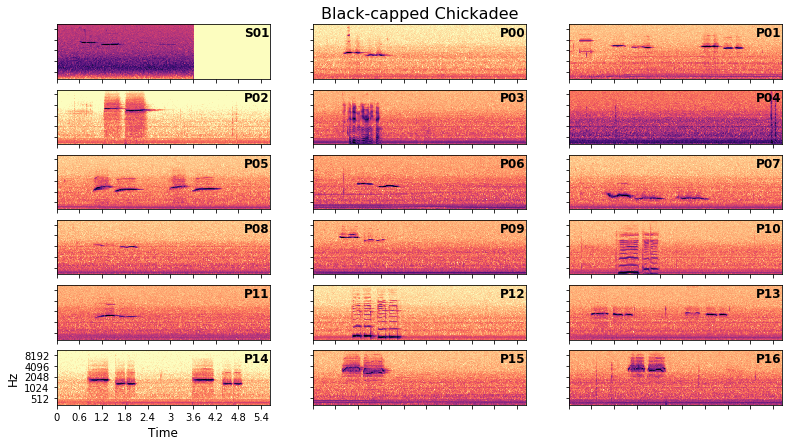

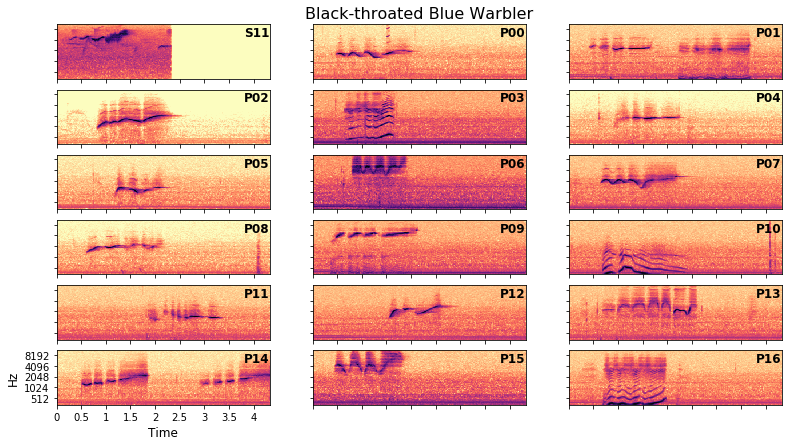

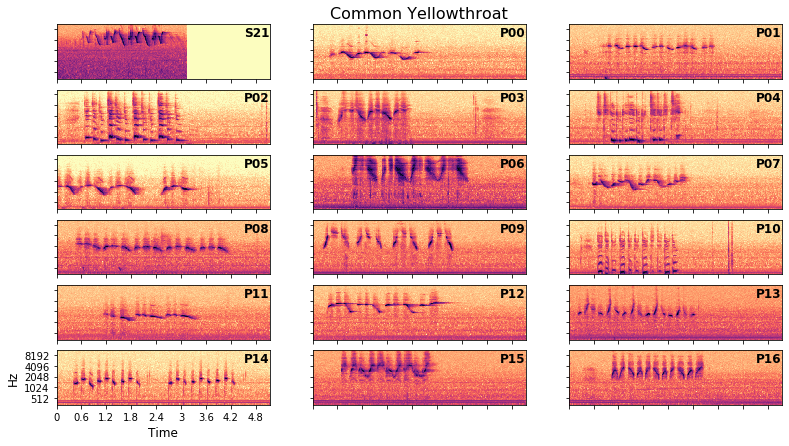

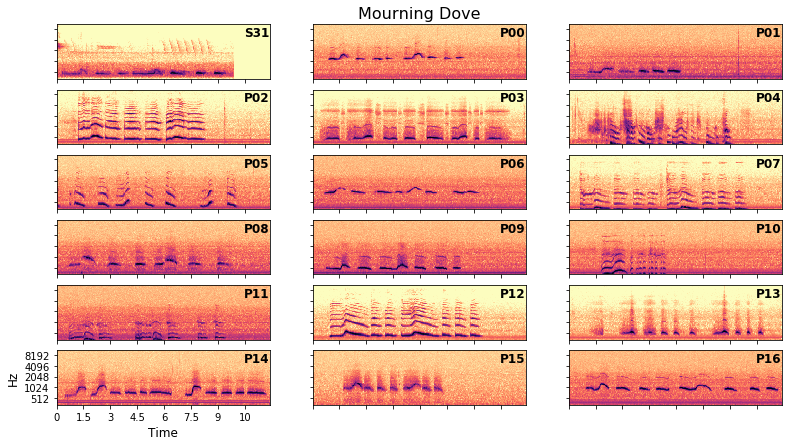

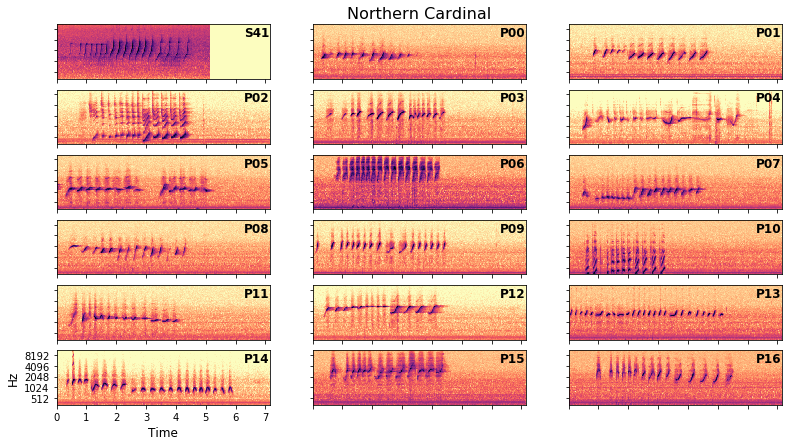

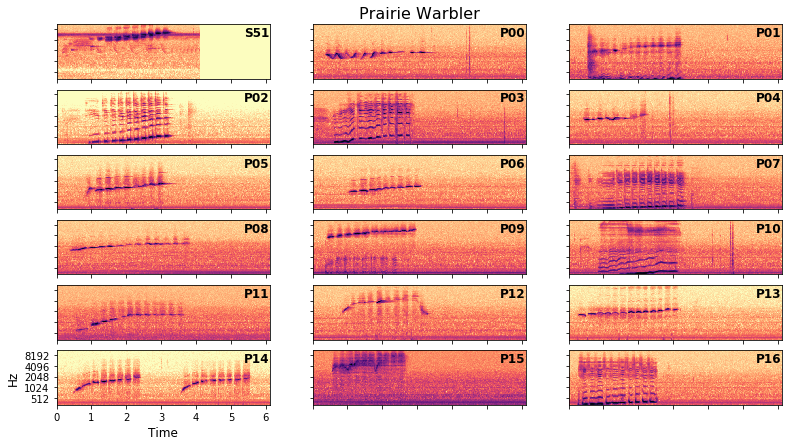

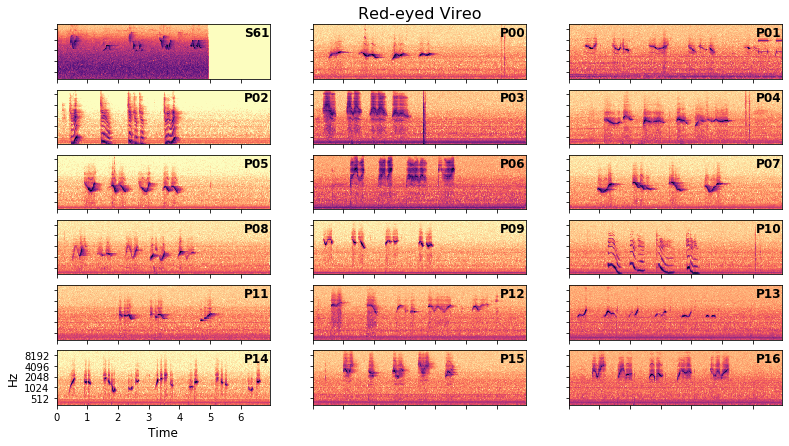

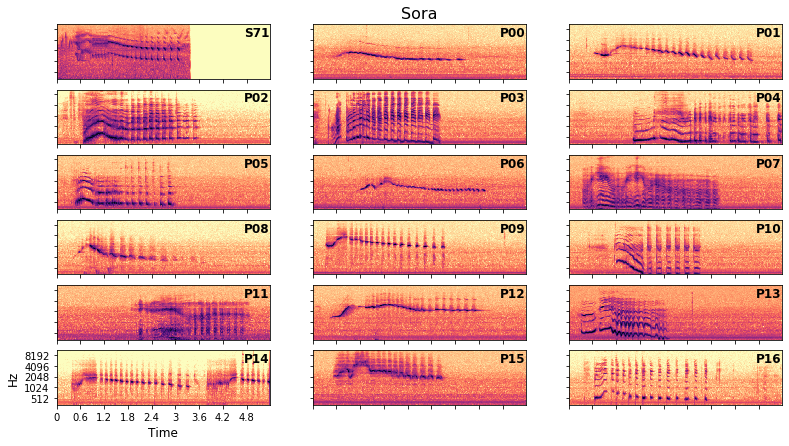

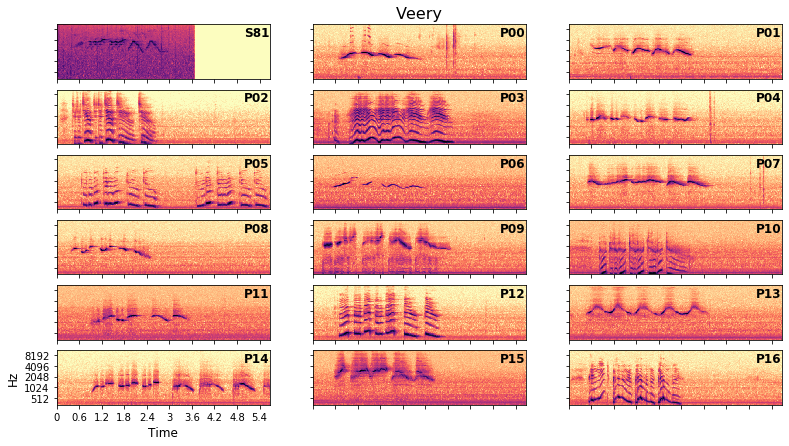

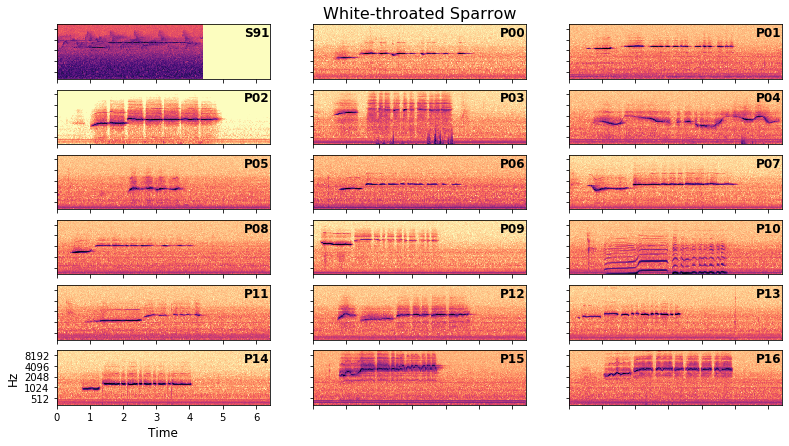

In [7]:
# ALL IMITATIONS OF ONE STIMULUS

pcol = 3
prow = 6
label_font = 12
from_corner = 0.12
title_font = 16
axis_font = 12

stimulus_numbers = np.arange(1, 100, 10)

for n_stimulus in stimulus_numbers:
    stimulus = stimulus_matrix[n_stimulus,]
    n_species = int(np.floor(n_stimulus/10))
    species = species_strings[n_species]

    stimulus_longer = np.append(stimulus, np.zeros((2*sr, )))
    
    melspec_st = librosa.feature.melspectrogram(
            y=stimulus_longer, sr=sr, fmin=fmin, fmax=fmax, 
            hop_length=hop_length, n_mels=n_mels)
    
    len_sec = len(stimulus_longer)/sr
    label_x = len_sec - from_corner*len_sec
    label_y = fmax - from_corner*(fmax-fmin)
    
    fig = plt.figure(figsize=(13, 7))  
    i = 1
    ax = plt.subplot(prow, pcol, i)
    librosa.display.specshow(
            librosa.power_to_db(S=melspec_st, ref=np.max),
                sr=sr,fmin=fmin, fmax=fmax,
                x_axis='time', y_axis='mel', cmap='magma_r',
                )
        
    ax.set_yticklabels([])
    ax.set_xticklabels([])
    ax.yaxis.set_label_text("")
    ax.xaxis.set_label_text("")
    
    label = 'S%02d' %n_stimulus
    plt.annotate(s=label, xy=(label_x, label_y), fontweight='bold', fontsize=label_font, va='top')
    
        
    for n_participant in range(n_participants):
        
        imitation = imitation_matrix[n_participant, n_stimulus]
        
        melspec_im = librosa.feature.melspectrogram(
            y=imitation, sr=sr, fmin=fmin, fmax=fmax, 
            hop_length=hop_length, n_mels=n_mels)

        i = i+1
        ax = plt.subplot(prow, pcol, i)
        
        librosa.display.specshow(
            librosa.power_to_db(S=melspec_im, ref=np.max),
                sr=sr,fmin=fmin, fmax=fmax,
                x_axis='time', y_axis='mel', cmap='magma_r')
        
        ax.set_yticklabels([])
        ax.set_xticklabels([])
        ax.yaxis.set_label_text("")
        ax.xaxis.set_label_text("")
        
        if i == 16:
            librosa.display.specshow(
                librosa.power_to_db(S=melspec_im, ref=np.max),
                    sr=sr,fmin=fmin, fmax=fmax,
                    x_axis='time', y_axis='mel', cmap='magma_r')
        ax.tick_params(axis='both', which='major', labelsize=10)
    
        if i == 2:
            plt.title(species, fontsize=title_font)
        #plt.colorbar(format='%+2.0f dB')
        #plt.title('Imitation')
        
        label = 'P%02d' %(n_participant)
        plt.annotate(s=label, xy=(label_x, label_y),fontweight='bold', fontsize=label_font, va='top')

        text_x, text_y = ax.yaxis.label, ax.xaxis.label
        font = matplotlib.font_manager.FontProperties(size=axis_font)
        text_x.set_font_properties(font)
        text_y.set_font_properties(font)
  
        # SAVE AUDIO
        path_aud = '../audio/ptp-%02d_stim-%02d_%s.wav' %(n_participant, n_stimulus, species)
        librosa.output.write_wav(path=path_aud, y=imitation, sr=sr)
    
    # SAVE FIGURE
    #path_fig = '../figures/data_spectrograms/stimuli_with_imitations/stim_%02d_with_all_imitations__%s.png'\
    #    %(n_stimulus, species)
    #plt.savefig(path_fig, dpi=500, bbox_inches="tight")



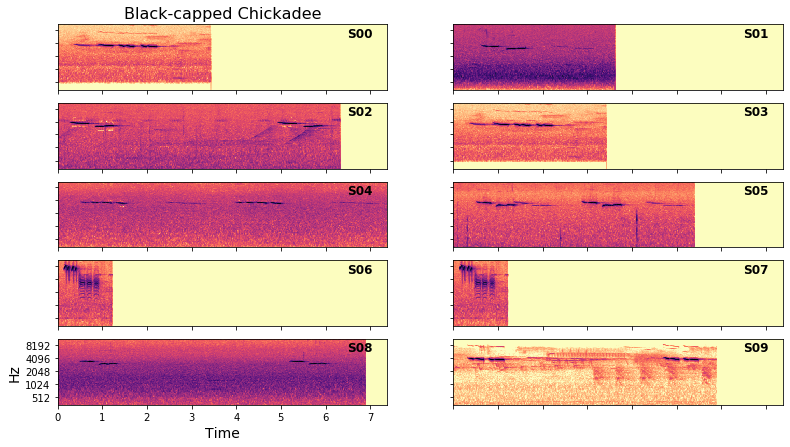

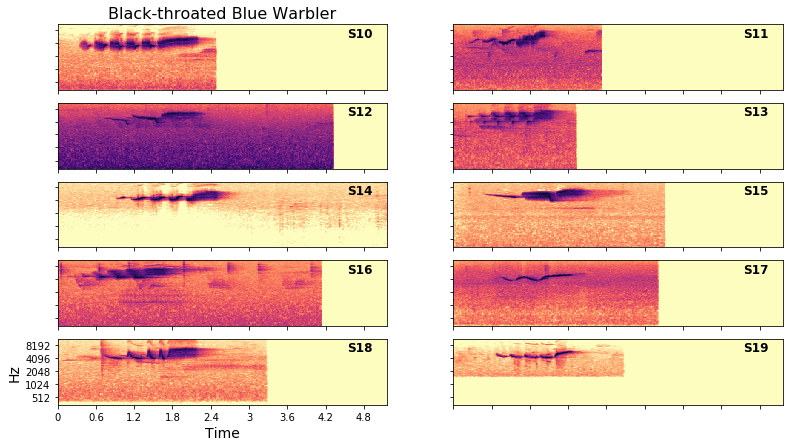

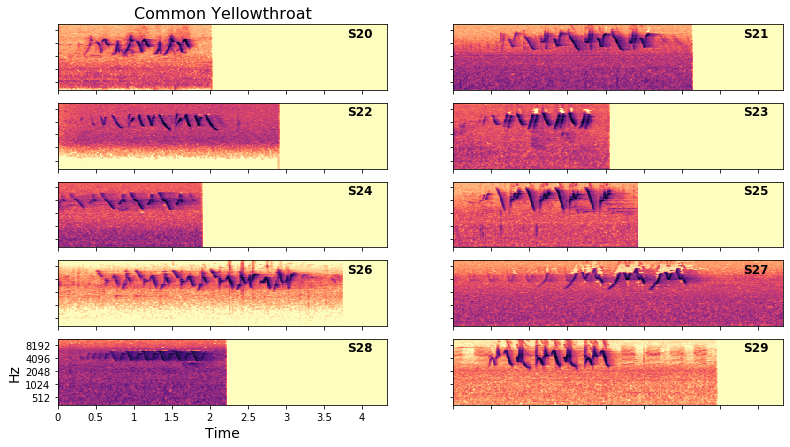

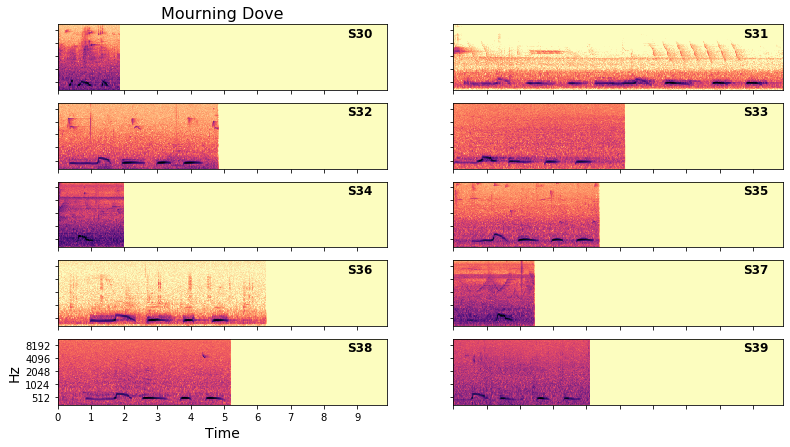

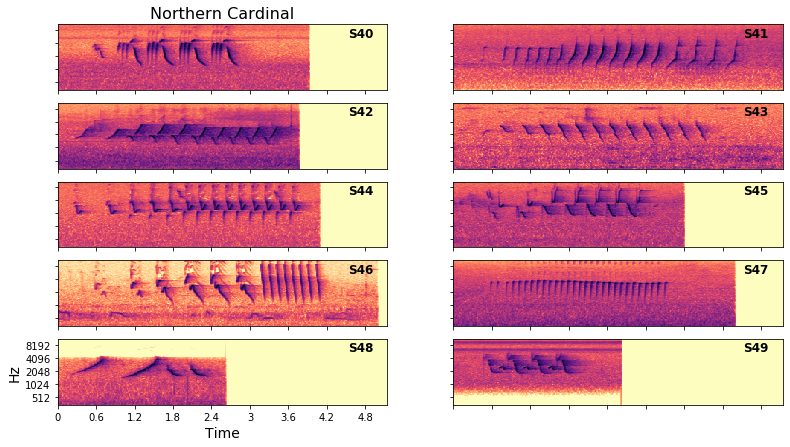

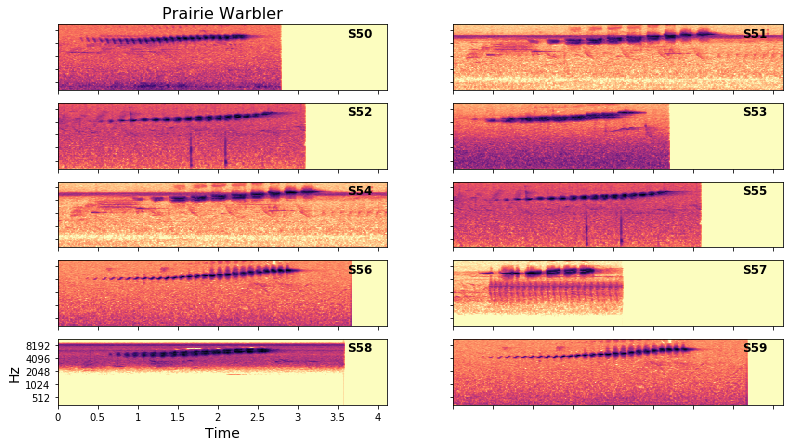

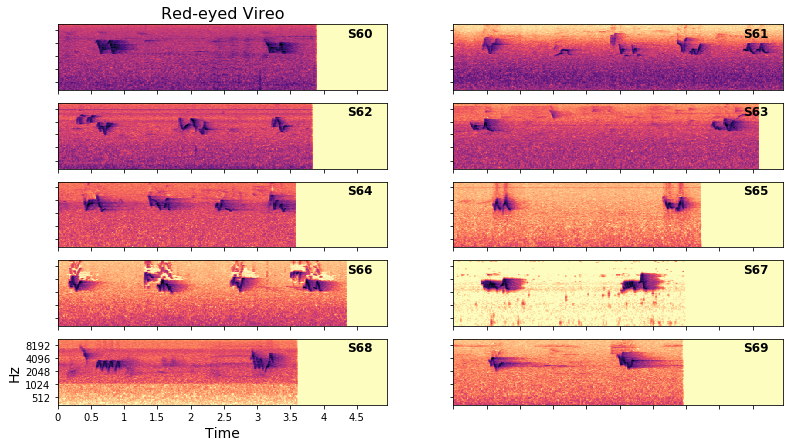

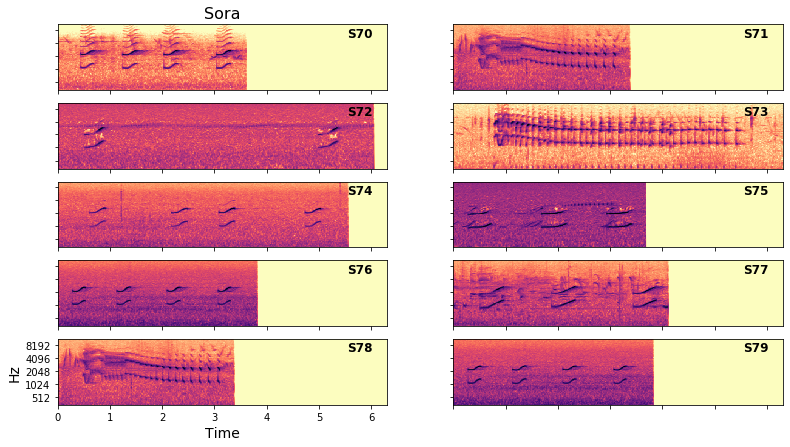

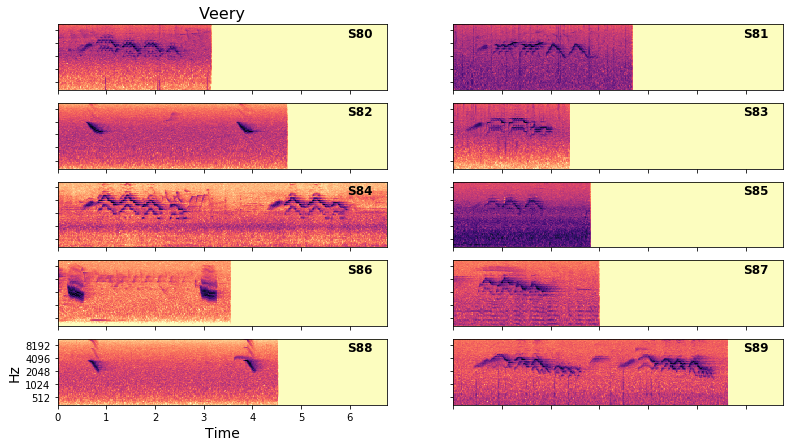

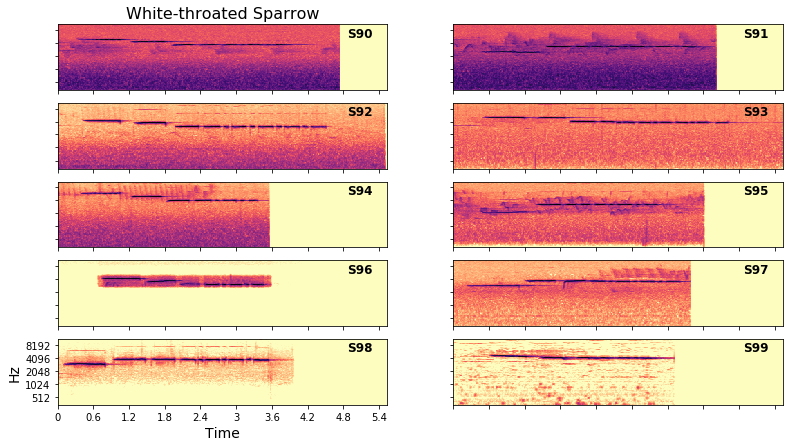

In [10]:
# ALL STIMULI FROM ONE SPECIES

pcol = 2
prow = 5
label_font = 12
from_corner = 0.12
title_font = 16
axis_font = 14

for n_species in range(10):

    lengths = []
    for i, n_stimulus in enumerate(range(n_species*10, n_species*10+10)):
        stimulus = stimulus_matrix[n_stimulus,]
        lengths.append(len(stimulus))

    max_length = np.max(lengths)

    fig = plt.figure(figsize=(13, 7)) 

    for i, n_stimulus in enumerate(range(n_species*10, n_species*10+10)):
        stimulus = stimulus_matrix[n_stimulus,]
        #n_species = int(np.floor(n_stimulus/10))
        species = species_strings[n_species]

        time_to_add = max_length - len(stimulus)
        stimulus_longer = np.append(stimulus, np.zeros((time_to_add, )))

        #species = species_matrix[n_participant, n_stimulus]
        melspec_st = librosa.feature.melspectrogram(
                y=stimulus_longer, sr=sr, fmin=fmin, fmax=fmax, 
                hop_length=hop_length, n_mels=n_mels)


        #cbar_ax = fig.add_axes([.91, .3, .03, .4])
        ax = plt.subplot(prow, pcol, i+1)
        librosa.display.specshow(
                librosa.power_to_db(S=melspec_st, ref=np.max),
                    sr=sr,fmin=fmin, fmax=fmax,
                    x_axis='time', y_axis='mel', cmap='magma_r',
                    )

        ax.tick_params(axis='both', which='major', labelsize=10)

        label = 'S%02d' %n_stimulus
        len_sec = len(stimulus_longer)/sr
        label_x = len_sec - from_corner*len_sec
        label_y = fmax - from_corner*(fmax-fmin)

        plt.annotate(s=label, xy=(label_x, label_y), fontweight='bold', fontsize=label_font, va='top')    
        if i == 0:
            plt.title(species, fontsize=title_font)
            #plt.colorbar(ax=cbar_ax).set_label('dB')

        if i != 8:
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.yaxis.set_label_text("")
            ax.xaxis.set_label_text("")

        text_x, text_y = ax.yaxis.label, ax.xaxis.label
        font = matplotlib.font_manager.FontProperties(size=axis_font)
        text_x.set_font_properties(font)
        text_y.set_font_properties(font)
  
    
        # SAVE AUDIO
        path_aud = '../audio/stim-%02d_%s.wav' %(n_stimulus, species)
        librosa.output.write_wav(path=path_aud, y=stimulus, sr=sr)
    
    # SAVE FIGURE
    path_fig = '../figures/data_spectrograms/stimuli_per_species/spec_%02d_all_stimuli__%s.png'\
        %(n_species, species)
    plt.savefig(path_fig, dpi=500, bbox_inches="tight")


In [ ]:
# ALL IMITATIONS FROM ONE PARTICIPANT

pcol = 4
prow = 5
label_font = 12
from_corner = 0.19
title_font = 16
axis_font = 12

stimuli_numbers = np.arange(1, 100, 10)
participant_numbers = np.arange(17)

for n_participant in participant_numbers:
    fig = plt.figure(figsize=(13, 7))
    i = 0
    for n_stimulus in stimuli_numbers:
        stimulus = stimulus_matrix[n_stimulus,]
        stimulus_longer = np.append(stimulus, np.zeros((2*sr, )))
        melspec_st = librosa.feature.melspectrogram(
            y=stimulus_longer, sr=sr, fmin=fmin, fmax=fmax, 
            hop_length=hop_length, n_mels=n_mels)
        i = i + 1
        ax = plt.subplot(prow, pcol, i)
        librosa.display.specshow(
            librosa.power_to_db(S=melspec_st, ref=np.max),
                sr=sr,fmin=fmin, fmax=fmax,
                x_axis='time', y_axis='mel', cmap='magma_r')
        
        n_species = int(np.floor(n_stimulus/10))
        species = species_strings[n_species]
        plt.title(species)
        
        label = 'S%02d' %n_stimulus
        len_sec = len(stimulus_longer)/sr
        label_x = len_sec - from_corner*len_sec
        label_y = fmax - from_corner*(fmax-fmin)
        plt.annotate(s=label, xy=(label_x, label_y), fontweight='bold', fontsize=label_font, va='top')  
        
        if i != 17: 
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.yaxis.set_label_text("")
            ax.xaxis.set_label_text("")
        else:
            text_x, text_y = ax.yaxis.label, ax.xaxis.label
            font = matplotlib.font_manager.FontProperties(size=axis_font)
            text_x.set_font_properties(font)
            text_y.set_font_properties(font)
        
        
        imitation = imitation_matrix[n_participant, n_stimulus]
        melspec_im = librosa.feature.melspectrogram(
            y=imitation, sr=sr, fmin=fmin, fmax=fmax, 
            hop_length=hop_length, n_mels=n_mels)
        i = i + 1
        ax = plt.subplot(prow, pcol, i)
        librosa.display.specshow(
            librosa.power_to_db(S=melspec_im, ref=np.max),
                sr=sr,fmin=fmin, fmax=fmax,
                x_axis='time', y_axis='mel', cmap='magma_r')
        
        label = 'P%02d' %(n_participant)
        plt.annotate(s=label, xy=(label_x, label_y), fontweight='bold', fontsize=label_font, va='top')    

        if i != 17: 
            ax.set_yticklabels([])
            ax.set_xticklabels([])
            ax.yaxis.set_label_text("")
            ax.xaxis.set_label_text("")
        else:
            text_x, text_y = ax.yaxis.label, ax.xaxis.label
            font = matplotlib.font_manager.FontProperties(size=axis_font)
            text_x.set_font_properties(font)
            text_y.set_font_properties(font)
            
        # SAVE AUDIO
        path_aud = '../audio/ptp-%02d_stim-%02d_%s.wav' %(n_participant, n_stimulus, species)
        librosa.output.write_wav(path=path_aud, y=stimulus, sr=sr)
    
            
    plt.tight_layout()

    # SAVE FIGURE
    path_fig = '../figures/data_spectrograms/imitations_per_participant_each_species/ptp_%02d_with_1_imitation_per_species.png' \
        %n_participant
    plt.savefig(path_fig, dpi=500, bbox_inches="tight")



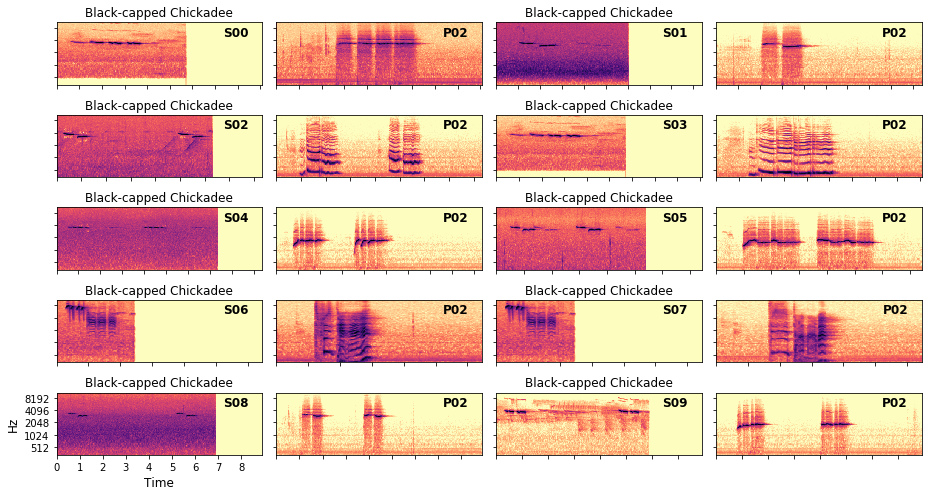

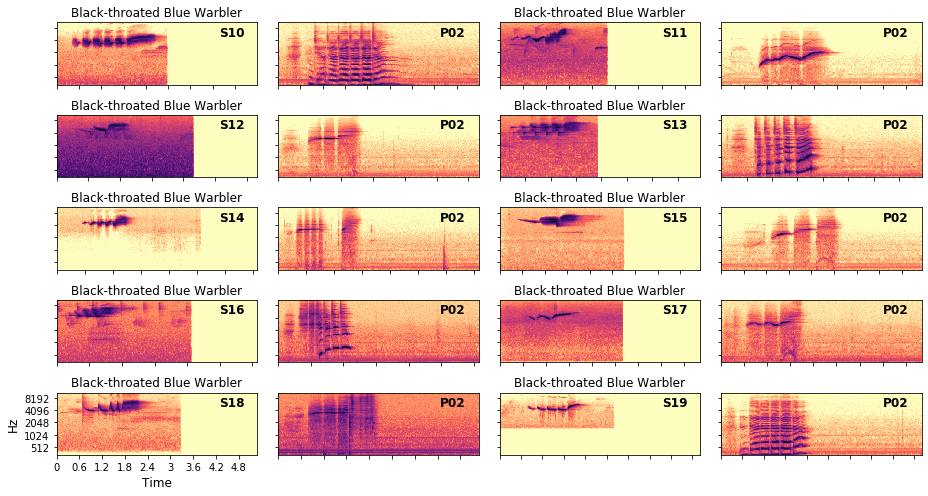

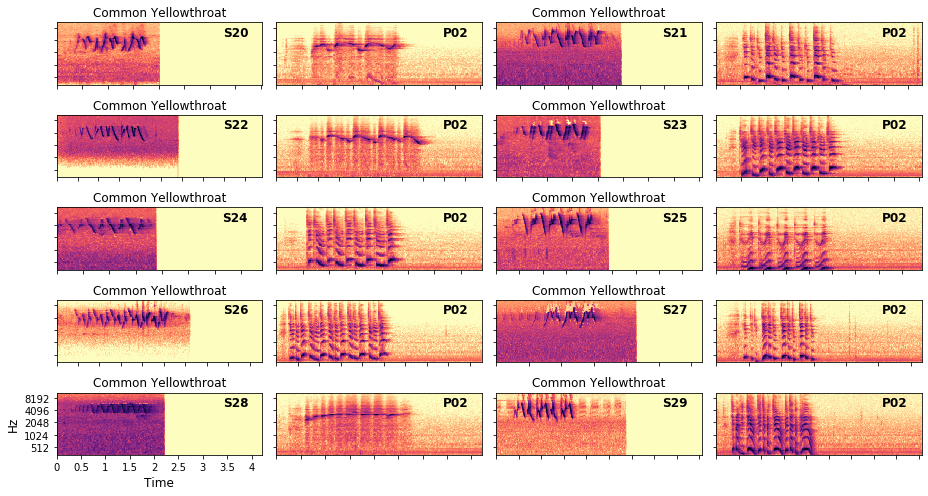

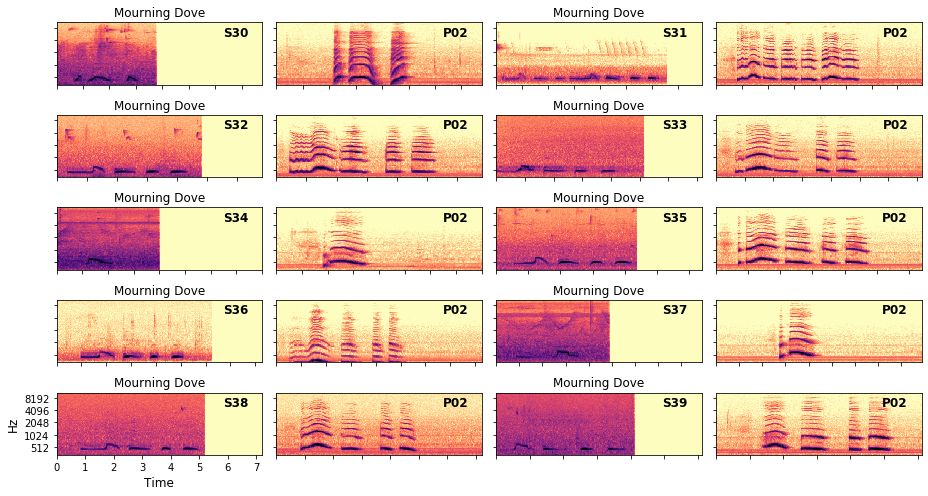

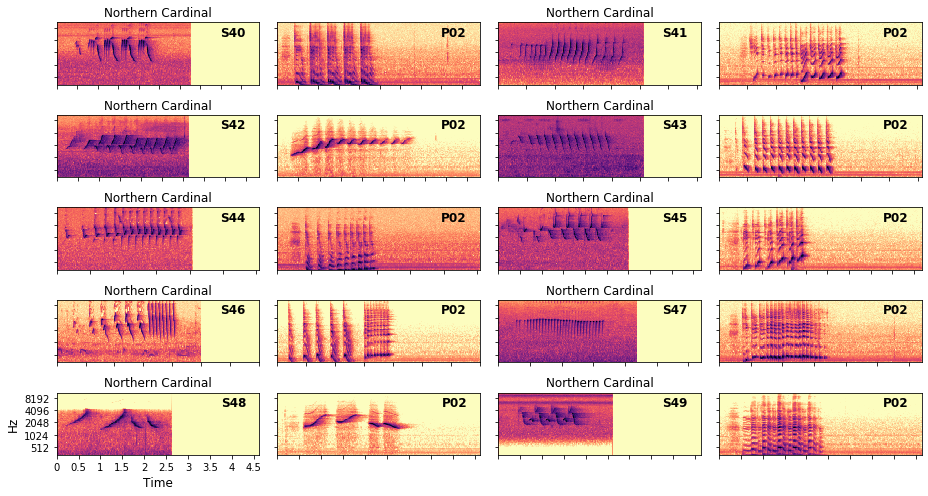

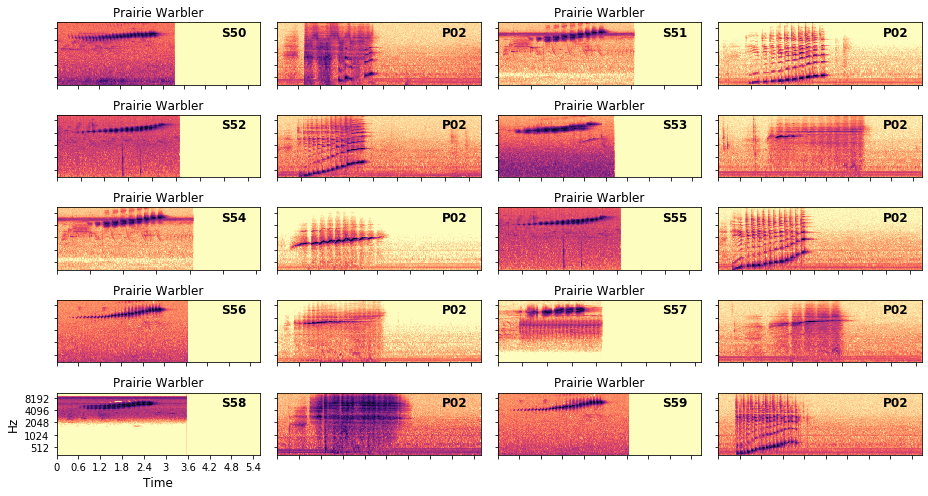

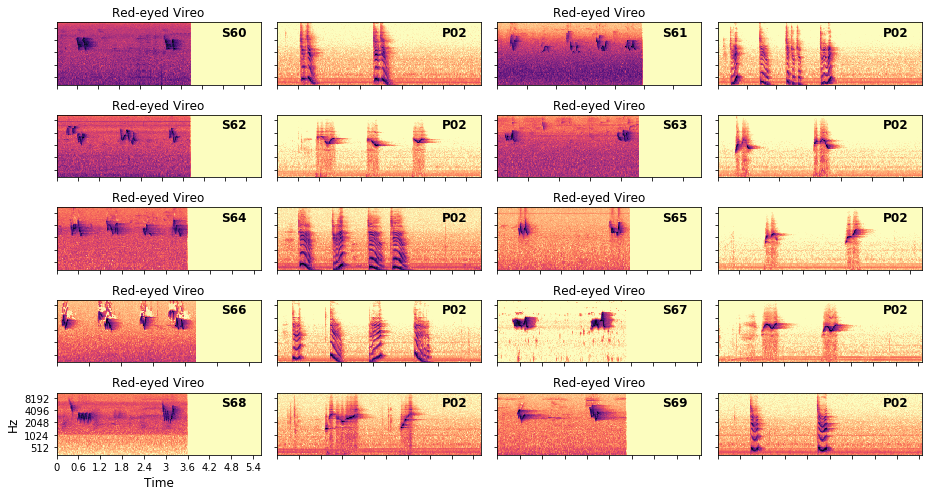

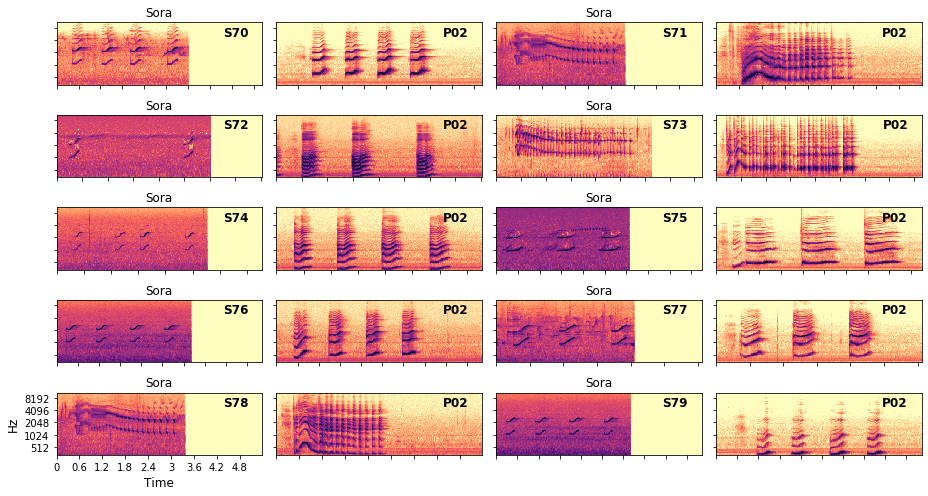

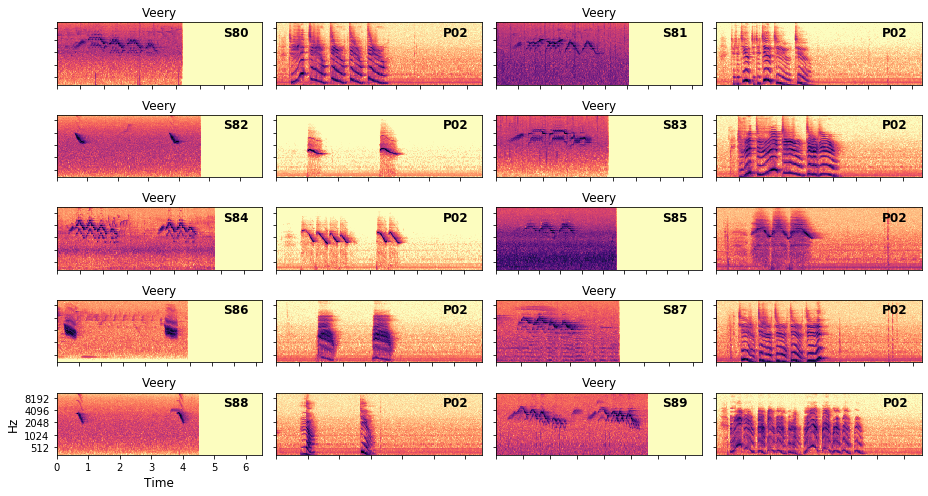

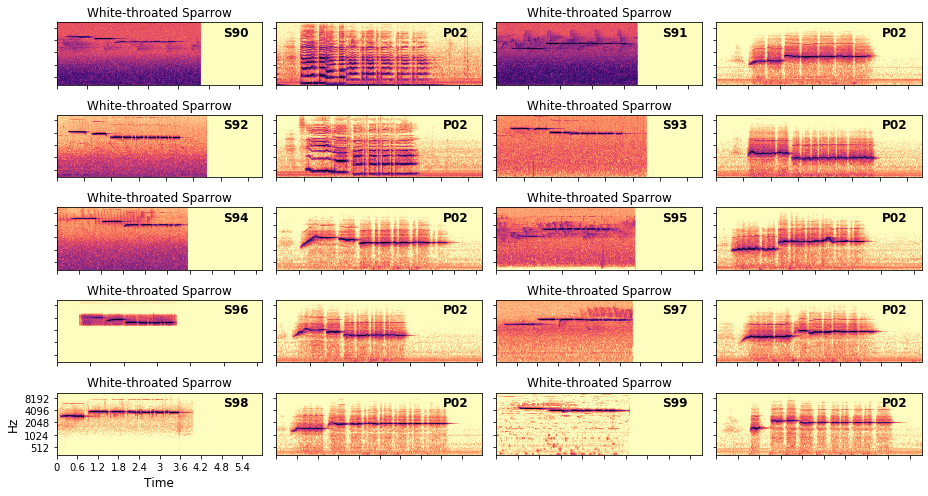

In [7]:
# ALL IMITATIONS FROM ONE PARTICIPANT FOR THE SAME SPECIES
#***************BROKEN*************
pcol = 4
prow = 5
label_font = 12
from_corner = 0.19
title_font = 16
axis_font = 12


participant_numbers = np.arange(17)
for n_species in range(10):
    stimuli_numbers = np.arange(n_species * 10, n_species * 10 + 10)
    for n_participant in [2]:#participant_numbers:
        fig = plt.figure(figsize=(13, 7))
        i = 0
        for n_stimulus in stimuli_numbers:
            stimulus = stimulus_matrix[n_stimulus,]
            stimulus_longer = np.append(stimulus, np.zeros((2*sr, )))
            melspec_st = librosa.feature.melspectrogram(
                y=stimulus_longer, sr=sr, fmin=fmin, fmax=fmax, 
                hop_length=hop_length, n_mels=n_mels)
            i = i + 1
            ax = plt.subplot(prow, pcol, i)
            librosa.display.specshow(
                librosa.power_to_db(S=melspec_st, ref=np.max),
                    sr=sr,fmin=fmin, fmax=fmax,
                    x_axis='time', y_axis='mel', cmap='magma_r')

            species = species_strings[n_species]
            plt.title(species)

            label = 'S%02d' %n_stimulus
            len_sec = len(stimulus_longer)/sr
            label_x = len_sec - from_corner*len_sec
            label_y = fmax - from_corner*(fmax-fmin)
            plt.annotate(s=label, xy=(label_x, label_y), fontweight='bold', fontsize=label_font, va='top')  

            if i != 17: 
                ax.set_yticklabels([])
                ax.set_xticklabels([])
                ax.yaxis.set_label_text("")
                ax.xaxis.set_label_text("")
            else:
                text_x, text_y = ax.yaxis.label, ax.xaxis.label
                font = matplotlib.font_manager.FontProperties(size=axis_font)
                text_x.set_font_properties(font)
                text_y.set_font_properties(font)


            imitation = imitation_matrix[n_participant, n_stimulus]
            melspec_im = librosa.feature.melspectrogram(
                y=imitation, sr=sr, fmin=fmin, fmax=fmax, 
                hop_length=hop_length, n_mels=n_mels)
            i = i + 1
            ax = plt.subplot(prow, pcol, i)
            librosa.display.specshow(
                librosa.power_to_db(S=melspec_im, ref=np.max),
                    sr=sr,fmin=fmin, fmax=fmax,
                    x_axis='time', y_axis='mel', cmap='magma_r')

            label = 'P%02d' %(n_participant)
            plt.annotate(s=label, xy=(label_x, label_y), fontweight='bold', fontsize=label_font, va='top')    

            if i != 17: 
                ax.set_yticklabels([])
                ax.set_xticklabels([])
                ax.yaxis.set_label_text("")
                ax.xaxis.set_label_text("")
            else:
                text_x, text_y = ax.yaxis.label, ax.xaxis.label
                font = matplotlib.font_manager.FontProperties(size=axis_font)
                text_x.set_font_properties(font)
                text_y.set_font_properties(font)

            # SAVE AUDIO
            path_aud = '../audio/ptp-%02d_stim-%02d_%s.wav' %(n_participant, n_stimulus, species)
            librosa.output.write_wav(path=path_aud, y=stimulus, sr=sr)


        plt.tight_layout()

        # SAVE FIGURE
        path_fig = '../figures/data_spectrograms/imitations_per_participant_same_species/ptp-%02d_spc-%02d_all-imitations.png' \
            %(n_participant, n_species)
        plt.savefig(path_fig, dpi=500, bbox_inches="tight")


In [8]:
stimuli_numbers

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10])

## get colorbar

In [ ]:
fig = plt.figure(figsize=(5, 3)) 

for n_stimulus in [1]:
    stimulus = stimulus_matrix[n_stimulus,]

    melspec_st = librosa.feature.melspectrogram(
            y=stimulus, sr=sr, fmin=fmin, fmax=fmax, 
            hop_length=hop_length, n_mels=n_mels)
    
    librosa.display.specshow(
            librosa.power_to_db(S=melspec_st, ref=np.max),
                sr=sr,fmin=fmin, fmax=fmax,
                x_axis='time', y_axis='mel', cmap='magma_r',
                )
    
    ax.tick_params(axis='both', which='major', labelsize=10)
    
    plt.colorbar().set_label('dB')
    
    text = ax.yaxis.label
    font = matplotlib.font_manager.FontProperties(family='times new roman', style='italic', size=16)
    text.set_font_properties(font)

    #plt.tight_layout()